### The Aim of this project is to just detect whether a worker is wearing all the safety PPEs in the videos and images. This can be used in intelligent surveillance systems for monitoring safety of construction workers.

In [1]:
# Importing packages
import cv2
import cvzone
import math
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
import os    
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [3]:
# Importing YOLO MODEL
from ultralytics import YOLO

### Checking the Performance of yolov8l model:
### Prediction on a sample image using Yolo model via command line Interface(CLI) :

In [3]:
!yolo task=detect mode=predict model=yolov8l.pt conf=0.25 source='https://ultralytics.com/images/bus.jpg'

Ultralytics YOLOv8.1.24 ðŸš€ Python-3.10.13 torch-2.2.1+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
YOLOv8l summary (fused): 268 layers, 43668288 parameters, 0 gradients, 165.2 GFLOPs

image 1/1 C:\Users\arsam\bus.jpg: 640x480 5 persons, 1 bicycle, 1 bus, 774.5ms
Speed: 7.5ms preprocess, 774.5ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict
ðŸ’¡ Learn more at https://docs.ultralytics.com/modes/predict



  0%|          | 0.00/83.7M [00:00<?, ?B/s]
  0%|          | 232k/83.7M [00:00<00:51, 1.69MB/s]
  0%|          | 400k/83.7M [00:00<00:53, 1.62MB/s]
  1%|          | 648k/83.7M [00:00<00:45, 1.92MB/s]
  1%|1         | 1.12M/83.7M [00:00<00:29, 2.96MB/s]
  2%|2         | 1.77M/83.7M [00:00<00:22, 3.75MB/s]
  3%|2         | 2.18M/83.7M [00:00<00:24, 3.48MB/s]
  3%|3         | 2.88M/83.7M [00:00<00:19, 4.31MB/s]
  4%|4         | 3.45M/83.7M [00:00<00:18, 4.54MB/s]
  5%|4         | 4.16M/83.7M [00:01<00:16, 5.02MB/s]
  6%|5         | 4.98M/83.7M [00:01<00:14, 5.81MB/s]
  7%|6         | 5.54M/83.7M [00:01<00:14, 5.69MB/s]
  7%|7         | 6.09M/83.7M [00:01<00:14, 5.58MB/s]
  8%|7         | 6.63M/83.7M [00:01<00:15, 5.23MB/s]
  9%|8         | 7.14M/83.7M [00:01<00:15, 5.12MB/s]
  9%|9         | 7.76M/83.7M [00:01<00:14, 5.36MB/s]
 10%|#         | 8.74M/83.7M [00:01<00:11, 6.55MB/s]
 11%|#1        | 9.38M/83.7M [00:02<00:12, 6.15MB/s]
 12%|#1        | 9.97M/83.7M [00:02<00:13, 5.78MB/s]
 14%

In [3]:
bus_original = cv2.imread("C:/Users/arsam/bus.jpg")
output_bus = cv2.imread("C:/Users/arsam/runs/detect/predict/bus.jpg")
resized = cv2.resize(output_bus,(400,600))

In [6]:
output_bus.shape

(1080, 810, 3)

In [7]:
resized.shape

(600, 400, 3)

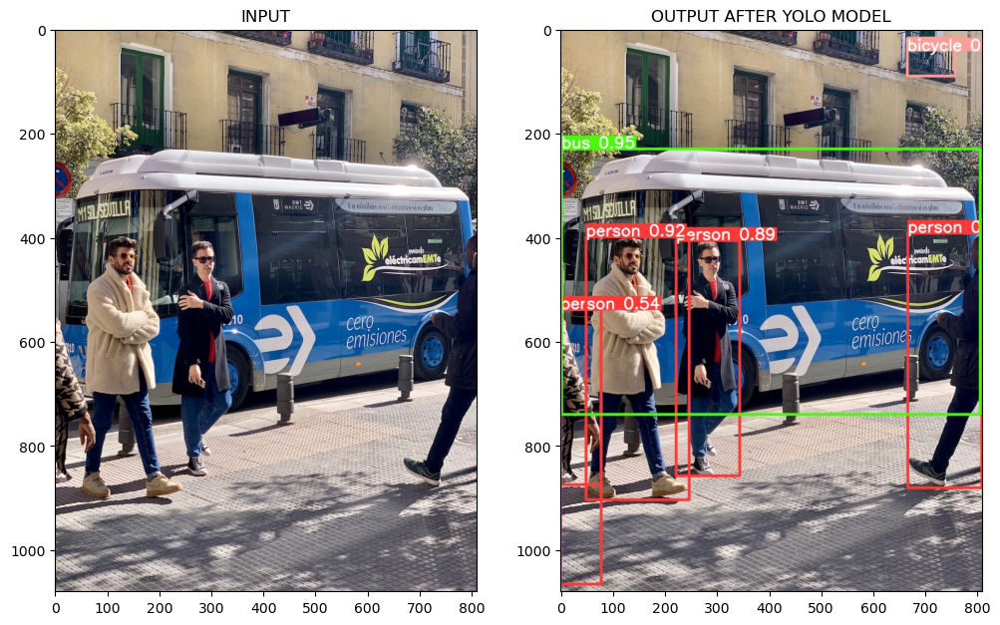

In [10]:
# Visualization of Input and Output Image:
fig, axes =plt.subplots (1, 2,figsize=(12,8))
axes[0].set_title("INPUT")
axes[0].imshow(cv2.cvtColor(bus_original,cv2.COLOR_BGR2RGB))
axes[1].set_title("OUTPUT AFTER YOLO MODEL")
axes[1].imshow(cv2.cvtColor(output_bus,cv2.COLOR_BGR2RGB))

## Predicting another image using Yolo model via command line Interface(CLI) :

In [7]:
!yolo task=detect mode=predict model=yolov8l.pt conf=0.25 source="D:/Downloads/samuel2 fb.jpg"

Ultralytics YOLOv8.1.24 ðŸš€ Python-3.10.13 torch-2.2.1+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
YOLOv8l summary (fused): 268 layers, 43668288 parameters, 0 gradients, 165.2 GFLOPs

image 1/1 D:\Downloads\samuel2 fb.jpg: 640x480 3 persons, 625.0ms
Speed: 0.0ms preprocess, 625.0ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 480)
Results saved to runs\detect\predict2
ðŸ’¡ Learn more at https://docs.ultralytics.com/modes/predict


In [11]:
Input_sam = cv2.imread("D:/Downloads/samuel2 fb.jpg")
Output_sam = cv2.imread("C:/Users/arsam/runs/detect/predict2/samuel2 fb.jpg")

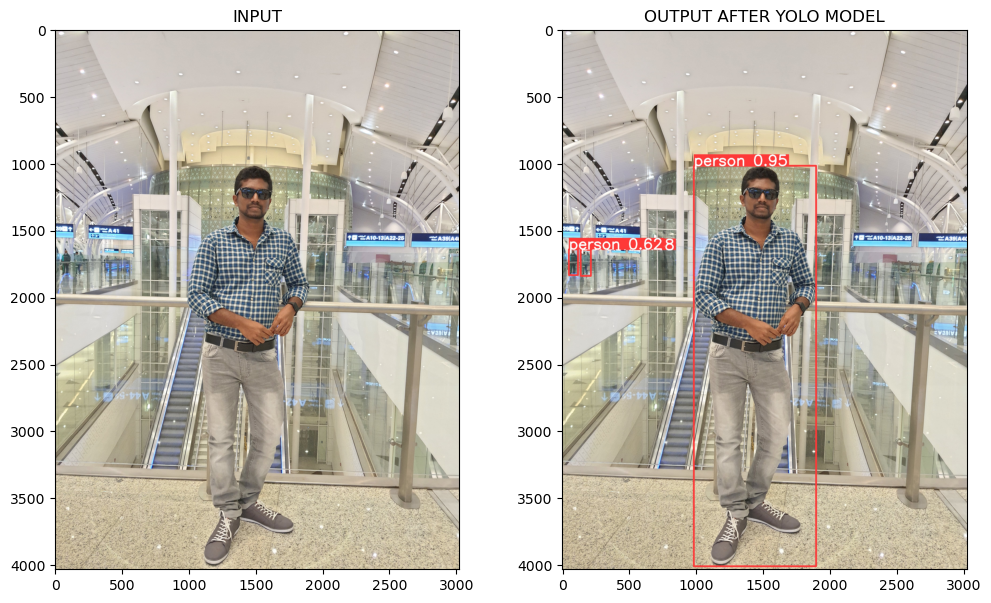

In [14]:
# Visualization of Input and Output Image:
fig, axes =plt.subplots (1, 2,figsize=(12,7))
axes[0].set_title("INPUT")
axes[0].imshow(cv2.cvtColor(Input_sam,cv2.COLOR_BGR2RGB))
axes[1].set_title("OUTPUT AFTER YOLO MODEL")
axes[1].imshow(cv2.cvtColor(Output_sam,cv2.COLOR_BGR2RGB))

### EXPLORATORY DATA ANALYSIS(EDA) ON Construction Site Dataset(Images):

In [4]:
# Data path
data_path = "D:/Downloads/Construction Site Safety.v27-yolov8.yolov8"
# Train, Valid and Test path
train_path = os.path.join(data_path, 'train')
valid_path = os.path.join(data_path, 'valid')
test_path = os.path.join(data_path, 'test')
# For saving results
output_path = 'D:/Downloads'
# We can access both images and labels
folders = ['images', 'labels']
print("Data Path: {}\nTrain Path: {}\nValid Path: {}\nTest Path: {}\nOutput Path: {}".format(data_path, train_path, valid_path, test_path, output_path))

Data Path: D:/Downloads/Construction Site Safety.v27-yolov8.yolov8
Train Path: D:/Downloads/Construction Site Safety.v27-yolov8.yolov8\train
Valid Path: D:/Downloads/Construction Site Safety.v27-yolov8.yolov8\valid
Test Path: D:/Downloads/Construction Site Safety.v27-yolov8.yolov8\test
Output Path: D:/Downloads


In [5]:
# Initialize dictionaries of training and classes
train_dict = dict(train=0, valid=1, test=2)
path_dict = [train_path, valid_path, test_path]
class_names = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone', 'Safety Vest', 'machinery', 'vehicle']
class_dict = dict(zip(range(len(class_names)), class_names))
print(class_dict)

{0: 'Hardhat', 1: 'Mask', 2: 'NO-Hardhat', 3: 'NO-Mask', 4: 'NO-Safety Vest', 5: 'Person', 6: 'Safety Cone', 7: 'Safety Vest', 8: 'machinery', 9: 'vehicle'}


In [6]:
## Get filenames and labels information
# Sorting the filenames will make the labels and images in same order 
train_filenames = sorted(os.listdir(os.path.join(train_path, folders[0])))
valid_filenames = sorted(os.listdir(os.path.join(valid_path, folders[0])))
test_filenames = sorted(os.listdir(os.path.join(test_path, folders[0])))
train_labels = sorted(os.listdir(os.path.join(train_path, folders[1])))
valid_labels = sorted(os.listdir(os.path.join(valid_path, folders[1])))
test_labels = sorted(os.listdir(os.path.join(test_path, folders[1])))

### Check these things:
1.Length of training/validation/test filenames are same as training/validation/test labels
2.Order of training/validation/test filenames are same as training/validation/test labels
3.Leakage of files and duplicate entries in training/validation/test filenames

In [7]:
# checking length of files:
# Return lengths of all filenames
print("Total Train Files: {}\nTotal Valid Files: {}\nTotal Test Files:{}".format(len(train_filenames), len(valid_filenames), len(test_filenames)))

Total Train Files: 2603
Total Valid Files: 114
Total Test Files:82


In [8]:
# Check whether filenames and labels are of same length
len(train_filenames)==len(train_labels), len(valid_filenames)==len(valid_labels), len(test_filenames)==len(test_labels)

(True, True, True)

In [9]:
# Check order in filenames and labels in all splits
[item.split('.')[0] for item in train_filenames]==[item.split('.')[0] for item in train_labels],\
[item.split('.')[0] for item in valid_filenames]==[item.split('.')[0] for item in valid_labels],\
[item.split('.')[0] for item in test_filenames]==[item.split('.')[0] for item in test_labels]

(True, True, True)

In [10]:
#Check Leakage:
#We will check whether any filename is present in more than one set. This is known as leakage in datasets. 
#If some filenames are common in more than one set say training or validation, then the training will not be dependable.
set(train_filenames).intersection(set(valid_filenames)),\
set(valid_filenames).intersection(set(test_filenames)),\
set(test_filenames).intersection(set(train_filenames))

(set(), set(), set())

In [ ]:
# set is empty. so there is  no leakage.

In [11]:
# Checking dupicate entries:
df = pd.DataFrame()
df['filenames'] = train_filenames + valid_filenames + test_filenames
df['labelnames'] = train_labels + valid_labels + test_labels
df['train_id'] = [0]*len(train_filenames) + [1]*len(valid_filenames) + [2]*len(test_filenames)
df.head()

,filenames,labelnames,train_id
0,-1670-_png_jpg.rf.0123125bb5159f8434130dcf436f...,-1670-_png_jpg.rf.0123125bb5159f8434130dcf436f...,0
1,-1670-_png_jpg.rf.2ac42681fa66c65ac7594b891b52...,-1670-_png_jpg.rf.2ac42681fa66c65ac7594b891b52...,0
2,-1670-_png_jpg.rf.2ef0952f6731ec685d1d25d38a6e...,-1670-_png_jpg.rf.2ef0952f6731ec685d1d25d38a6e...,0
3,-1670-_png_jpg.rf.424337c85f2ffeb9fb3a42f77af2...,-1670-_png_jpg.rf.424337c85f2ffeb9fb3a42f77af2...,0
4,-1670-_png_jpg.rf.b78b932a9dd4325b9f2268f25719...,-1670-_png_jpg.rf.b78b932a9dd4325b9f2268f25719...,0


In [12]:
# checking duplicate entries:
df.filenames.duplicated().value_counts()

filenames
False    2799
Name: count, dtype: int64

In [ ]:
# So there is no duplicate files.

## VISUALIZATION OF TRAIN IMAGES:

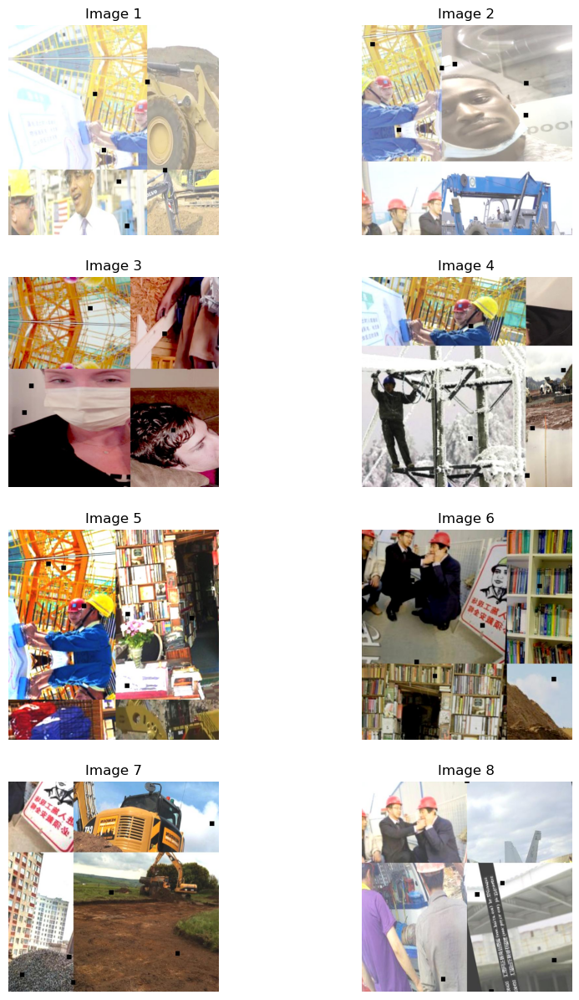

In [16]:

fig, axes = plt.subplots(4, 2, figsize=(10, 15))
axes = axes.flatten()
# Loop through the first 8 images:
for i, image_file in enumerate(train_filenames[:8]):
    # Read the image using cv2
    image_path = os.path.join(train_path, folders[0], image_file)
    image = cv2.imread(image_path)

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image
    axes[i].imshow(image)
    axes[i].set_title(f"Image {i+1}")
    axes[i].axis('off')


## VISUALIZATION OF VALIDATION IMAGES:

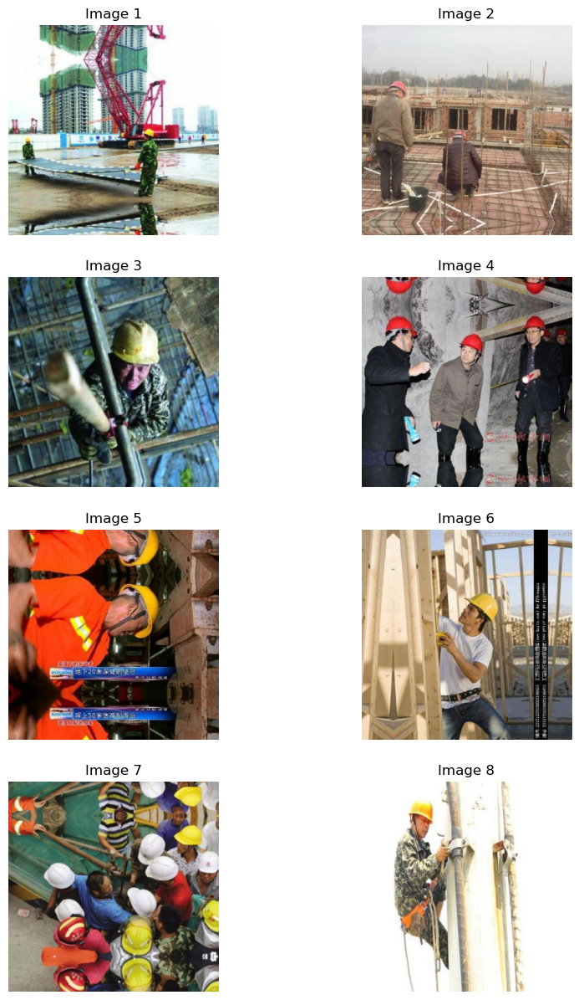

In [17]:
fig, axes = plt.subplots(4, 2, figsize=(10, 15))
axes = axes.flatten()
# Loop through the first 8 images:
for i, image_file in enumerate(valid_filenames[:8]):
    # Read the image using cv2
    image_path = os.path.join(valid_path, folders[0], image_file)
    image = cv2.imread(image_path)

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image
    axes[i].imshow(image)
    axes[i].set_title(f"Image {i+1}")
    axes[i].axis('off')

## VISUALIZATION OF TEST IMAGES:

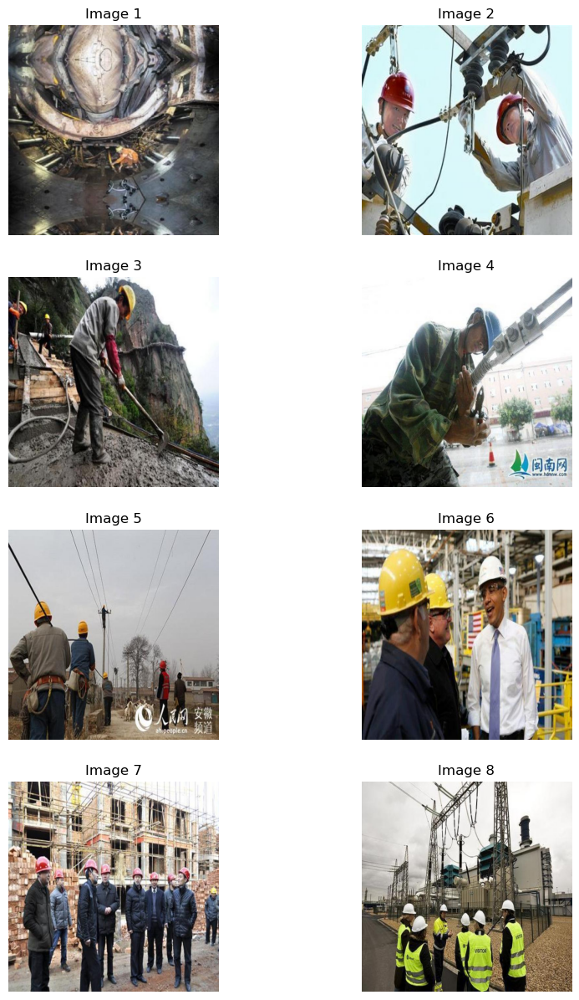

In [18]:
fig, axes = plt.subplots(4, 2, figsize=(10, 15))
axes = axes.flatten()
# Loop through the first 8 images:
for i, image_file in enumerate(test_filenames[:8]):
    # Read the image using cv2
    image_path = os.path.join(test_path, folders[0], image_file)
    image = cv2.imread(image_path)

    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image
    axes[i].imshow(image)
    axes[i].set_title(f"Image {i+1}")
    axes[i].axis('off')

## Training a custom PPE detection model using yolov8 on our dataset:

In [ ]:
# We will use YoloV8 to train our custom object detection model

In [ ]:
# We will create a YAML file which will be used by the YoloV8 CLI for information. 
# It mentions the train, valid, test directories and the nc (number of classes) for training the model

In [ ]:
# We will use the Command Line Interface (CLI) command for training a custom model using YoloV8. 
#The arguments provided depends on our tasks and training. 
# We will train the model for 10 epochs on a pre-trained model (on COCO128 data) for our PPE Detection dataset.

In [5]:
!yolo task=detect mode=train model=yolov8l.pt data=../content/drive/MyDrive/ConstructionSiteSafety/data.yaml epochs=10 imgsz=640
# Here I trained the model for only 10 epoch since I didnt has GPU setups.
# We can make the model more accurate by training for large number of epochs, 
# or using different models provided within the YoloV8 assets.

100% 83.7M/83.7M [00:00<00:00, 241MB/s]
Ultralytics YOLOv8.1.24 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=../content/drive/MyDrive/ConstructionSiteSafety/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, sa

In [4]:
# Performing detection using trained weights.(Here we take the best weights after 100 epochs of Training)
model = YOLO("D:/Downloads/best.pt")

In [ ]:
#Now we will run the custom object detection model to predict PPEs on source files. 
#We have some videos and images on which we will run predictions. The predictions will be saved in working directory.

In [9]:
# Prediction on a video file:
results123 = model.predict(source ='D:/Downloads/ppe-3-1.mp4', save = True)
# The predicted video file will be stored in memory.



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/349) D:\Downloads\ppe-3-1.mp4: 384x640 3 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 5 Persons, 3 Safety Vests, 117.9ms
video 1/1 (2/349) D:\Downloads\ppe-3-1.mp4: 384x640 3 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 5 Persons, 3 Safety Vests, 60.1ms
video 1/1 (3/349) D:\Downloads\ppe-3-1.mp4: 384x640 3 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 5 Persons, 3 Safety Vests, 73.1ms
video 1/1 (4/349) D:\Downloads\ppe-3-1.mp4: 384x640 3 Hardhats, 2 NO-Ma

video 1/1 (61/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 69.3ms
video 1/1 (62/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 53.5ms
video 1/1 (63/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 56.4ms
video 1/1 (64/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 53.7ms
video 1/1 (65/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 64.4ms
video 1/1 (66/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 54.1ms
video 1/1 (67/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 51.2ms
video 1/1 (68/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 

video 1/1 (125/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 64.5ms
video 1/1 (126/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 68.2ms
video 1/1 (127/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 53.7ms
video 1/1 (128/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 70.5ms
video 1/1 (129/349) D:\Downloads\ppe-3-1.mp4: 384x640 3 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 2 Safety Vests, 61.3ms
video 1/1 (130/349) D:\Downloads\ppe-3-1.mp4: 384x640 3 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 56.2ms
video 1/1 (131/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 55.1ms
video 1/1 (132/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety 

video 1/1 (189/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 56.7ms
video 1/1 (190/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 64.6ms
video 1/1 (191/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 51.1ms
video 1/1 (192/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 70.0ms
video 1/1 (193/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 64.7ms
video 1/1 (194/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 68.9ms
video 1/1 (195/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 3 Persons, 3 Safety Vests, 53.5ms
video 1/1 (196/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety 

video 1/1 (254/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 1 NO-Mask, 1 NO-Safety Vest, 6 Persons, 2 Safety Vests, 72.2ms
video 1/1 (255/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 1 NO-Mask, 1 NO-Safety Vest, 4 Persons, 2 Safety Vests, 53.4ms
video 1/1 (256/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 1 NO-Mask, 1 NO-Safety Vest, 4 Persons, 2 Safety Vests, 65.7ms
video 1/1 (257/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 1 NO-Mask, 1 NO-Safety Vest, 4 Persons, 2 Safety Vests, 81.5ms
video 1/1 (258/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 1 NO-Mask, 2 NO-Safety Vests, 4 Persons, 2 Safety Vests, 92.8ms
video 1/1 (259/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 2 NO-Safety Vests, 6 Persons, 2 Safety Vests, 74.9ms
video 1/1 (260/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 2 NO-Safety Vests, 6 Persons, 2 Safety Vests, 81.5ms
video 1/1 (261/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 3 NO-Masks, 2 NO-Safety Ve

video 1/1 (317/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 4 NO-Masks, 1 NO-Safety Vest, 7 Persons, 2 Safety Vests, 67.5ms
video 1/1 (318/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 3 NO-Masks, 1 NO-Safety Vest, 8 Persons, 1 Safety Vest, 65.8ms
video 1/1 (319/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 7 Persons, 1 Safety Vest, 64.8ms
video 1/1 (320/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 6 Persons, 1 Safety Vest, 69.9ms
video 1/1 (321/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 6 Persons, 2 Safety Vests, 62.2ms
video 1/1 (322/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 6 Persons, 2 Safety Vests, 65.9ms
video 1/1 (323/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest, 6 Persons, 1 Safety Vest, 55.1ms
video 1/1 (324/349) D:\Downloads\ppe-3-1.mp4: 384x640 2 Hardhats, 2 NO-Masks, 1 NO-Safety Vest

In [77]:
# Prediction on custom Images:
Pred_samples = model.predict(source ='D:\PPE DETECTION SAMPLE IMAGES', save = True, line_width=11)


image 1/5 D:\PPE DETECTION SAMPLE IMAGES\1.jpg: 640x320 1 Person, 47.3ms
image 2/5 D:\PPE DETECTION SAMPLE IMAGES\2.jpg: 640x320 1 Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 2 Persons, 62.5ms
image 3/5 D:\PPE DETECTION SAMPLE IMAGES\3.jpg: 640x320 1 NO-Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 62.9ms
image 4/5 D:\PPE DETECTION SAMPLE IMAGES\IMG_20240229_191039.jpg: 640x320 1 Hardhat, 1 NO-Mask, 1 NO-Safety Vest, 1 Person, 1 vehicle, 47.9ms
image 5/5 D:\PPE DETECTION SAMPLE IMAGES\IMG_20240301_181833.jpg: 640x320 1 Hardhat, 1 NO-Safety Vest, 3 Persons, 61.9ms
Speed: 1.2ms preprocess, 56.5ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 320)
Results saved to runs\detect\predict3


In [71]:
Input_1 = cv2.imread("D:/PPE DETECTION SAMPLE IMAGES/2.jpg")
Output_1 = cv2.imread("C:/Users/arsam/runs/detect/predict3/2.jpg")
Input_2 = cv2.imread('D:/PPE DETECTION SAMPLE IMAGES/3.jpg')
Output_2 = cv2.imread("C:/Users/arsam/runs/detect/predict3/3.jpg")

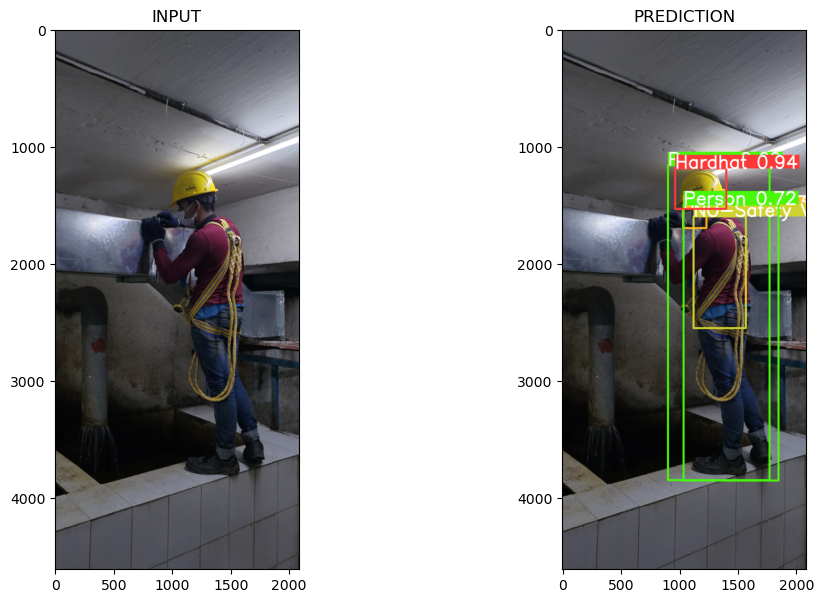

In [80]:
# Visualization of Input and Output Image:
fig, axes =plt.subplots (1, 2,figsize=(12,7))
axes[0].set_title("INPUT")
axes[0].imshow(cv2.cvtColor(Input_1,cv2.COLOR_BGR2RGB))
axes[1].set_title("PREDICTION")
axes[1].imshow(cv2.cvtColor(Output_1,cv2.COLOR_BGR2RGB))

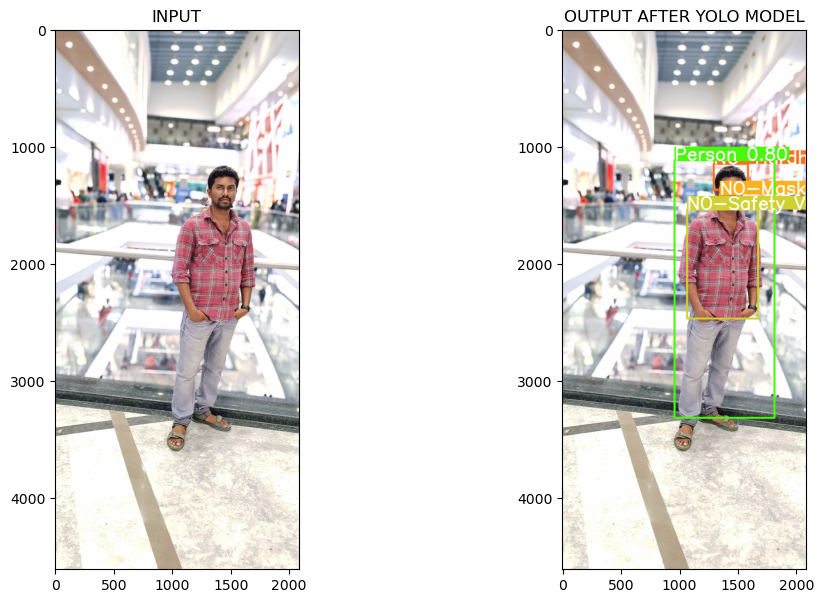

In [79]:
# Visualization of Input and Output Image:
fig, axes =plt.subplots (1, 2,figsize=(12,7))
axes[0].set_title("INPUT")
axes[0].imshow(cv2.cvtColor(Input_2,cv2.COLOR_BGR2RGB))
axes[1].set_title("OUTPUT AFTER YOLO MODEL")
axes[1].imshow(cv2.cvtColor(Output_2,cv2.COLOR_BGR2RGB))

##  VISUALIZING PERFORMANCE METRICS OF CUSTOM TRAINED YOLO.V8 MODEL:

In [33]:
# Visualizing Results:
# let us see the accuracy, precision, recall scores of each epochs:
df_results = pd.read_csv("D:/Downloads/Git-PPE Detection Project/results/results.csv")
df_results.tail(10)

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
90,90,0.80730,0.62131,1.0758,0.85227,0.74209,0.78384,0.49289,1.3115,0.79493,1.3984,0.001189,0.001189,0.001189
91,91,0.79181,0.59836,1.0619,0.90237,0.71641,0.79165,0.48990,1.3461,0.80722,1.4270,0.001090,0.001090,0.001090
92,92,0.77922,0.58569,1.0580,0.88655,0.72409,0.79697,0.48915,1.3230,0.78425,1.4172,0.000991,0.000991,0.000991
93,93,0.77659,0.58274,1.0577,0.91319,0.72663,0.80097,0.50171,1.3190,0.76529,1.3953,0.000892,0.000892,0.000892
94,94,0.77135,0.58119,1.0570,0.91675,0.73149,0.80683,0.49830,1.2994,0.78188,1.3901,0.000793,0.000793,0.000793
95,95,0.76204,0.57300,1.0519,0.90843,0.73066,0.80446,0.50620,1.3053,0.76635,1.3954,0.000694,0.000694,0.000694
96,96,0.75781,0.57187,1.0509,0.88593,0.73448,0.80630,0.50486,1.2930,0.76572,1.3878,0.000595,0.000595,0.000595
97,97,0.75637,0.56598,1.0451,0.90523,0.73441,0.80610,0.50181,1.3074,0.76679,1.3994,0.000496,0.000496,0.000496
98,98,0.75012,0.56106,1.0425,0.89880,0.72993,0.80395,0.50417,1.3049,0.76852,1.3989,0.000397,0.000397,0.000397
99,99,0.74948,0.55902,1.0426,0.89994,0.73111,0.80881,0.50710,1.2910,0.76160,1.3917,0.000298,0.000298,0.000298


## Hence our model achieved Mean Average Precision score of 0.80 for 50% IOU threshold at 100th epoch which is a good score indicating that model is performing well.
## It indicates that the model is able to identify positive samples with high precision and high recall.

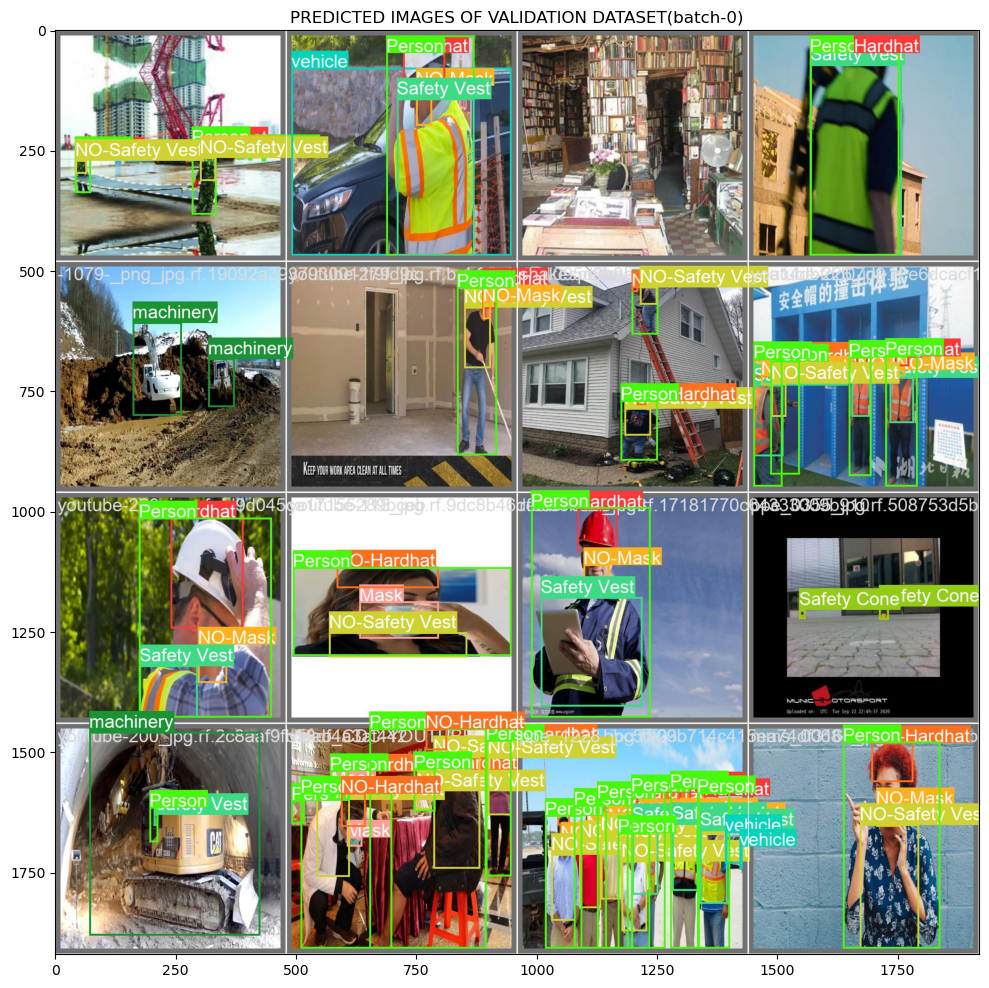

In [47]:
# Visualization of Predicted Images:
val_batch0_labels = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/val_batch0_labels.jpg')
val_batch0_pred = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/val_batch0_pred.jpg')
val_batch1_pred = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/val_batch1_pred.jpg')
val_batch2_pred = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/val_batch2_pred.jpg')
plt.figure(figsize=(15,12))
plt.title('PREDICTED IMAGES OF VALIDATION DATASET(batch-0)')
plt.imshow(cv2.cvtColor(val_batch0_labels,cv2.COLOR_BGR2RGB))

(-0.5, 1919.5, 1919.5, -0.5)

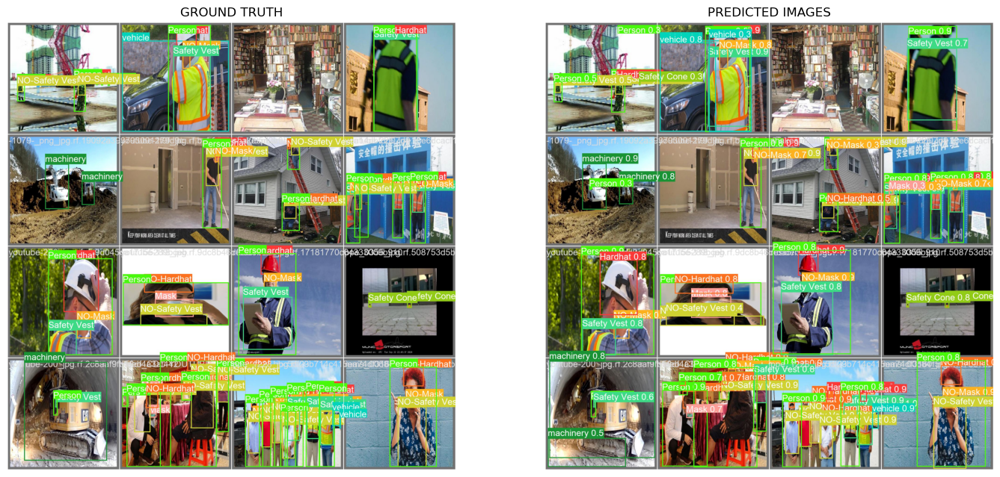

In [43]:
# Visualization of Predicted and Ground Truth(Labelled) Images:
fig, axes =plt.subplots (1, 2,figsize=(17,8))
axes[0].set_title("GROUND TRUTH")
axes[0].imshow(cv2.cvtColor(val_batch0_labels,cv2.COLOR_BGR2RGB))
axes[0].axis("off")
axes[1].set_title("PREDICTED IMAGES")
axes[1].imshow(cv2.cvtColor(val_batch0_pred,cv2.COLOR_BGR2RGB))
axes[1].axis("off")

## CONFUSION MATRIX:

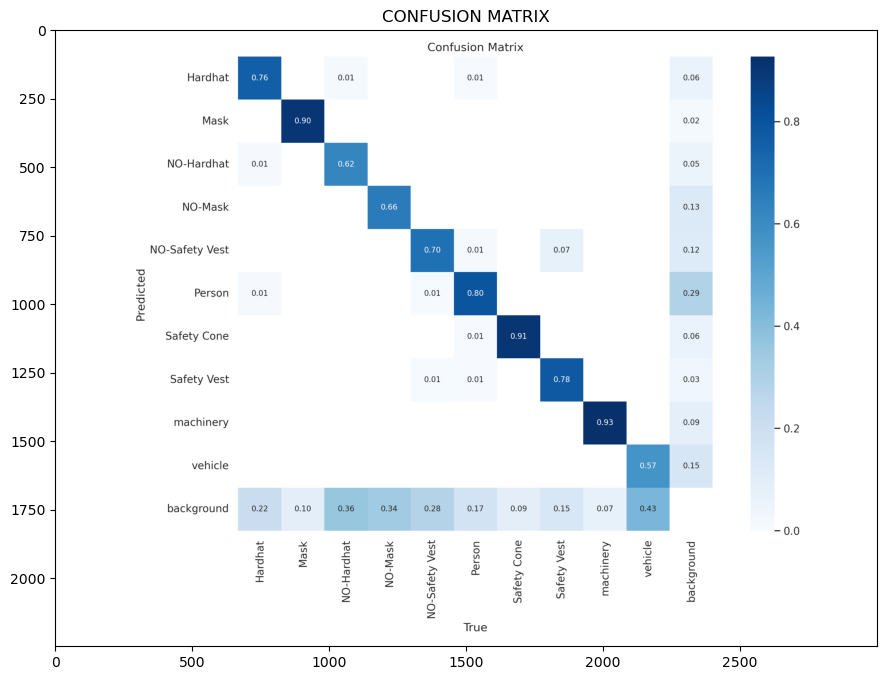

In [58]:
con_mat = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/confusion_matrix.png')
plt.figure(figsize=(12,8))
plt.title('CONFUSION MATRIX')
plt.imshow(cv2.cvtColor(con_mat,cv2.COLOR_BGR2RGB))

## Overall Performance Metrices :

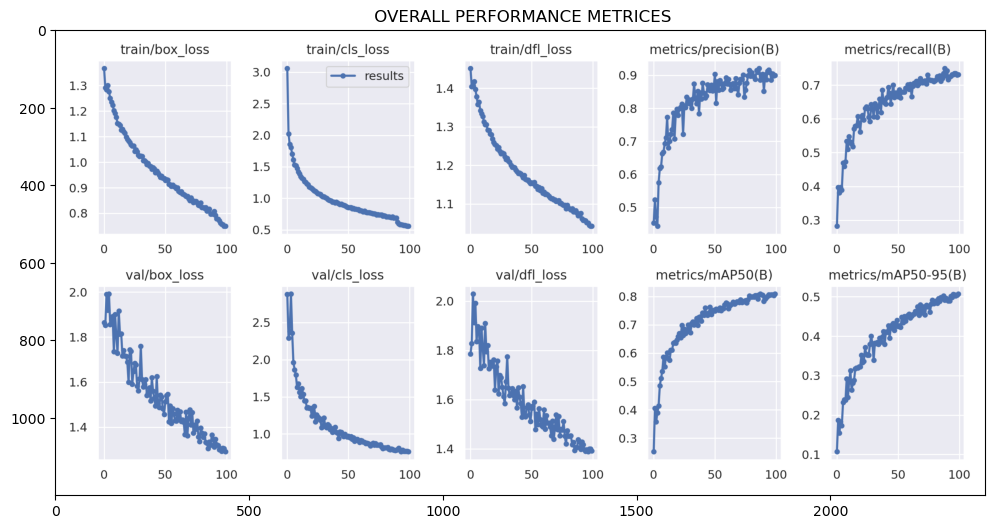

In [57]:
r = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/results.png')
plt.figure(figsize=(12,10))
plt.title(' OVERALL PERFORMANCE METRICES')
plt.imshow(cv2.cvtColor(r,cv2.COLOR_BGR2RGB))

In [59]:
lab = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/labels.jpg')
F1 = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/F1_curve.png')
P = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/P_curve.png')
R = cv2.imread('D:/Downloads/Git-PPE Detection Project/results/R_curve.png')

(-0.5, 2249.5, 1499.5, -0.5)

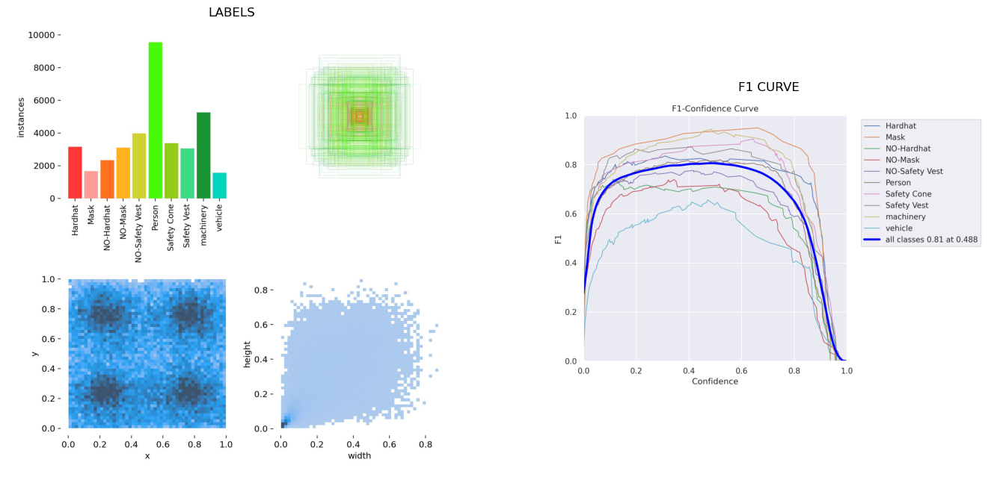

In [61]:
# Visualization of RESULTS:
fig, axes =plt.subplots (1, 2,figsize=(17,8))
axes[0].set_title("LABELS")
axes[0].imshow(cv2.cvtColor(lab,cv2.COLOR_BGR2RGB))
axes[0].axis("off")
axes[1].set_title("F1 CURVE")
axes[1].imshow(cv2.cvtColor(F1,cv2.COLOR_BGR2RGB))
axes[1].axis("off")

## Precision and Recall curve:

(-0.5, 2249.5, 1499.5, -0.5)

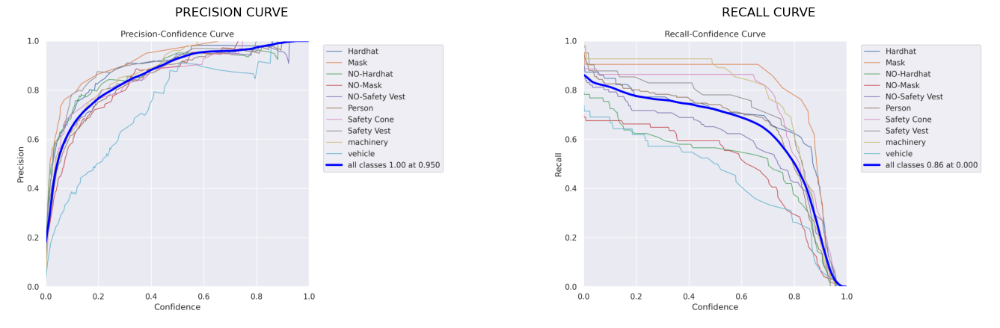

In [64]:
# Visualization of RESULTS:
fig, axes =plt.subplots (1, 2,figsize=(17,10))
axes[0].set_title("PRECISION CURVE")
axes[0].imshow(cv2.cvtColor(P,cv2.COLOR_BGR2RGB))
axes[0].axis("off")
axes[1].set_title("RECALL CURVE")
axes[1].imshow(cv2.cvtColor(R,cv2.COLOR_BGR2RGB))
axes[1].axis("off")

In [ ]:
# we can increase the performance of the model by running more epochs or training by using various models by yolov8.

## Implementing PPE Detection Custom trained model on webcam:
## Designing custom bounding box, text box on webcam video stream:

In [ ]:
cap = cv2.VideoCapture(0) # for laptop webcam
cap.set(3,1280)
cap.set(4,720)
# cap = cv2.VideoCapture("D:/Downloads/ppe-3-1.mp4")  # For Video

In [ ]:
classNames = ['Hardhat', 'Mask', 'NO-Hardhat', 'NO-Mask', 'NO-Safety Vest', 'Person', 'Safety Cone',
              'Safety Vest', 'machinery', 'vehicle']

In [ ]:
myColor = (0, 0, 255)

In [8]:
# streaming video from laptop webcam:
while True:
    success, img = cap.read()
    results = model(img, stream=True)
    for r in results:
        boxes = r.boxes
        for box in boxes:
            # Bounding Box
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
            # cv2.rectangle(img,(x1,y1),(x2,y2),(255,0,255),3)
            w, h = x2 - x1, y2 - y1
            # cvzone.cornerRect(img, (x1, y1, w, h))
 
            # Confidence
            conf = math.ceil((box.conf[0] * 100)) / 100
            # Class Name
            cls = int(box.cls[0])
            currentClass = classNames[cls]
            print(currentClass)
            if conf>0.5:
                if currentClass =='NO-Hardhat' or currentClass =='NO-Safety Vest' or currentClass == "NO-Mask":
                    myColor = (0, 0,255)
                elif currentClass =='Hardhat' or currentClass =='Safety Vest' or currentClass == "Mask":
                    myColor =(0,255,0)
                else:
                    myColor = (255, 0, 0)
 
                cvzone.putTextRect(img, f'{classNames[cls]} {conf}',
                                   (max(0, x1), max(35, y1)), scale=1, thickness=1,colorB=myColor,
                                   colorT=(255,255,255),colorR=myColor, offset=5)
                cv2.rectangle(img, (x1, y1), (x2, y2), myColor, 3)
 
    cv2.imshow("Image", img)
    cv2.waitKey(1)


0: 384x640 (no detections), 96.0ms
Speed: 15.6ms preprocess, 96.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 95.4ms
Speed: 9.7ms preprocess, 95.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 88.5ms
Speed: 5.9ms preprocess, 88.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 71.0ms
Speed: 4.1ms preprocess, 71.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 82.6ms
Speed: 3.2ms preprocess, 82.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 74.3ms
Speed: 0.0ms preprocess, 74.3ms inference, 0.0ms postprocess per image at shap


NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 98.9ms
Speed: 0.0ms preprocess, 98.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 87.5ms
Speed: 4.3ms preprocess, 87.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 80.0ms
Speed: 2.0ms preprocess, 80.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 81.1ms
Speed: 0.0ms preprocess, 81.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 81.1ms
Speed: 0.0ms preprocess, 81.1ms inference, 5.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 65.5ms
Speed: 5.4ms preprocess, 65.5ms inf

Speed: 3.6ms preprocess, 80.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 76.9ms
Speed: 0.0ms preprocess, 76.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 79.4ms
Speed: 0.0ms preprocess, 79.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 71.1ms
Speed: 0.0ms preprocess, 71.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 63.6ms
Speed: 0.0ms preprocess, 63.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 82.7ms
Speed: 2.7ms preprocess, 82.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardha


NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 77.0ms
Speed: 0.0ms preprocess, 77.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 71.1ms
Speed: 0.0ms preprocess, 71.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 77.5ms
Speed: 0.0ms preprocess, 77.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 75.5ms
Speed: 3.6ms preprocess, 75.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 81.1ms
Speed: 0.0ms preprocess, 81.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 80.8ms
Speed: 0.0ms preprocess, 80.8ms inf

Speed: 0.0ms preprocess, 77.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 78.7ms
Speed: 0.0ms preprocess, 78.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 72.0ms
Speed: 2.2ms preprocess, 72.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

Person
NO-Mask
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 72.5ms
Speed: 0.0ms preprocess, 72.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 78.1ms
Speed: 0.0ms preprocess, 78.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 75.1ms
Speed: 0.0ms preprocess, 75.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

Person
NO-Mask
NO


NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 75.1ms
Speed: 2.4ms preprocess, 75.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 76.1ms
Speed: 0.0ms preprocess, 76.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 62.2ms
Speed: 0.0ms preprocess, 62.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 98.5ms
Speed: 0.0ms preprocess, 98.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 105.8ms
Speed: 9.4ms preprocess, 105.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 96.0ms
Speed: 0.0ms preprocess, 96.0ms i

Speed: 0.0ms preprocess, 89.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 78.3ms
Speed: 0.0ms preprocess, 78.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 84.4ms
Speed: 0.0ms preprocess, 84.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 80.4ms
Speed: 4.1ms preprocess, 80.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 82.0ms
Speed: 2.3ms preprocess, 82.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 83.7ms
Speed: 0.0ms preprocess, 83.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO


NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 81.9ms
Speed: 0.0ms preprocess, 81.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 64.7ms
Speed: 0.0ms preprocess, 64.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 72.8ms
Speed: 0.0ms preprocess, 72.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 77.4ms
Speed: 0.0ms preprocess, 77.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 84.0ms
Speed: 0.0ms preprocess, 84.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 84.4ms
Speed: 0.0ms preprocess, 84.4ms inf

Speed: 2.6ms preprocess, 69.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 79.3ms
Speed: 0.0ms preprocess, 79.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 71.4ms
Speed: 0.0ms preprocess, 71.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 76.9ms
Speed: 0.0ms preprocess, 76.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 79.9ms
Speed: 0.0ms preprocess, 79.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 75.9ms
Speed: 1.7ms preprocess, 75.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO


NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 69.0ms
Speed: 0.0ms preprocess, 69.0ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Hardhat
NO-Mask
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 84.4ms
Speed: 0.0ms preprocess, 84.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 73.2ms
Speed: 0.0ms preprocess, 73.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 74.3ms
Speed: 4.0ms preprocess, 74.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
NO-Hardhat
Person
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 72.1ms
Speed: 0.0ms preprocess, 72.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)

NO-Mask
Person
NO-Hardhat
0: 384x640 1 NO-Hardhat, 1 NO-Mask, 1 Person, 72.6ms
Speed: 1.0ms preprocess, 72.6ms inf

KeyboardInterrupt: 

## Implement ID tracking and saving bboxes of people who miss out on wearing hardhats, masks or vests (this will be a great usecase for triggerring alarms and monitoring)